# Audio Manipulation and Convolutional Neural Network for Binary Classification -  Techno vs. EDM genres
This notebook will describe the process of converting audio mp3 files into spectrograms to use for modeling in a 1D and 2D convolutional neural network. Sections 1 and 2 will demonstrate how to use the Librosa library to process mp3 files using a couple of example tracks. Section 3 will build upon work from the previous notebooks and convert all mp3 links from the EDM and Techno playlists into spectrogram images that will be fed into a 1D neural network in Section 4, and a 2D network in Section 5.  

**Outline:**
- Section 1: [Example of Audio File and Spectrogram Manipulation using Librosa](#section1)
- Section 2: [Preliminary Anaysis of Techno vs. EDM Spectrograms](#section2)
- Section 3: [Spectrogram Conversion for All Tracks](#section3)
- Section 4: [Buidling a 1D Convolutional Neural Network](#section4)
- Section 5: [Building a 2D Convolutional Neural Network](#section5)


**References:**


- "Deep Learning Cookbook" examples: https://github.com/DOsinga/deep_learning_cookbook/blob/master/15.1%20Song%20Classification.ipynb
- Librosa documentation: https://librosa.github.io/librosa/tutorial.html

- Helpful resource for almost any audio questions: https://musicinformationretrieval.com/index.html


In [3]:
# load imports
import pandas as pd
import numpy as np
# from scipy.stats import mode
from sklearn.model_selection import train_test_split
import os
import sys
import configparser
import glob

import librosa
import librosa.display as display
import matplotlib.pyplot as plt
import IPython.display as ipd

import config

%matplotlib inline


 <a id='section1'></a>
## Section 1: Explanation of Audio File and Spectrogram Manipulation using Librosa
This section will demonstrate how to convert an mp3 file to a spectrogram and some additional preprocessing options available through Librosa.

#### Step 1.1: Convert mp3 to a waveplot
Here we will use the librosa library to convert a 30 second mp3 file to a waveform (or pressure-time plot) which represents the change in air pressure as amplitude over time.
- The function `librosa.load()` generates a time-series *y*, or 1D numpy array from the audio file using a default sampling rate (sr) of 22050 Hz.
- The sampling rate is the speed at which audio signals are digitized, so 22050 samples per second are recorded.
- This digitized signal can be visualuzed using librosa's `display.waveplot()` function. 

In [4]:
# Load the audio file as a waveform `y`, Store the sampling rate as `sr`
y, sr = librosa.load("./downloads/techno/0gob7FAHSVYipu1UF5CKzu.mp3") #from the techno playlist folder


print(y.shape) #length of audio array
print(y)
print(sr) # number of samples per second of audio, librosa uses a default of 22kHz sample

(662076,)
[-0.07974111 -0.02515003 -0.0927583  ...  0.          0.
  0.        ]
22050


The duration of the signal can be found by dividing the number of samples by the sampling rate. Here we see that our track is slightly longer than 30 seconds.

In [5]:
duration_seconds = float(len(y)) / sr
duration_seconds

30.026122448979592

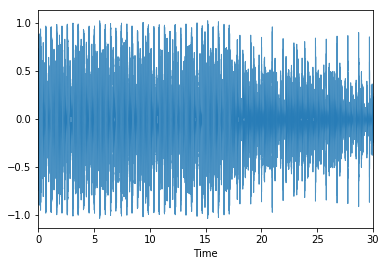

In [6]:
# Plot the amplitude envelope of a waveform (time-domain waveform of the audio signals)
display.waveplot(y, sr=sr, alpha = 0.8);

In [25]:
# Play the audio file from above
import IPython.display as ipd
# ipd.|Audio(y, rate=sr)

sample = ipd.Audio(y, rate=sr)

ipd.display_html(sample)

<source src="data:audio/wav;base64,UklGRpw0FABXQVZFZm10IBAAAAABAAEAIlYAAESsAAACABAAZGF0YXg0FABm9vn81PQt+7nzp/eqBMzy6f5c+xL1Ke/37ljxk/9e+wcA6An9+oMEFQIqDCr/tPbSBGH6tP3L/k8IkABj/Aj7nP7iA6v4ZAVq/0TxD/eF+//0wfMH6/fVMby2tJWoIKe0pC2iOLEHqwG1orYCvoLApMPTzVPTo9J7zh7Hbcj7ywzFE8hkwifH2r8IzFHJ4sXZzlfFyr8fxYDOt8Tj08LCAsyX1HbTHul/5iPoKenM4e7YROtc4kTjHukn6O/nqOHo4r/u0eCi3CHtWuti6oTsQ+jj6R/nkOPg7bvpovAd5uzq4Ocw3O7p5+eE4gDpPuax7Fzu/+dG7Sf5Gu3P6Ir3W/Mm7jL0Hfk39fj7jvwMADkEmAIQ+g4BlgTa+aj9+fx//rD60QDpCxQMKRv4FvAalSpGFM8b0CloGaMnny4rI6IiuyuaH+4hJy2UIe0n8SJ0ILYseCxJIFMl0C3UIkgqzimVHn4OKAgR/cv3lwXI/fkH+wFGAfcInhC9Ei8XExgJEjEYoRgnD2oT7hSmB38Yxg3yFqgZTRb8GMMQdxktGI8cshTuF+QhJxOrGIgozyKQMFktUijCLWEl7SqcLogpRDHpL1gwTiwRLvEudyaoMUonzCxkJs8hBCTTHVUgDx1cHkYhfBanFzcRdgni+CLsDfsT8jT5jP7i+Jj+bf+0/VEMGAndDUcNXALe/zr/Pwri/Kv4AACP9Wf6ifqb/AkJ9fgS+SUE2v8cAK8CswnO/HT8aAgaDw0WLA54G88LowlrFeANFBBHDwARcA8VC7EIjg0aBQIHpQP1CGIFcQgNEPD/VwzVB04FngjgAyfy/9aRy3PAK7rztrytCr+Gv5+yQ8YGzn7VRdUK03ncftsO2ibPQtGhywLKzNRdxqHQ9NcF5dnk6dwz7Vn0YPHP66Prc+rd2mrQttjc3zjkfecz2ZjJbcjRyxvYxNko5xLv4vK27jH3XfIi9SkES/yWA80GyQsXAqMAs/uYADH9ofYN8Jfx+vP47K7yVfeO/Av4EQg3BuEA8PkiFqI8nRbo81PrNe6N+G38S/5Y9Mvyp+6f5VTpROOh4IPc6Nuo42HfhutU7NPjfu0J8LQE6gMLCb8ksRyAKzYu4jMfM/MjhR7yBvAPJwT//3L96P80BMvzBwStC3QOeh+fJ6wo6ywyOdg8mDtpPO9AfkPQMy0rlR1zFZ4J8flj+bHpKujX6GHfQ/Ch8jT8oALHE+wZkyQqNPkv11g6azxntGJ5X6VcQVU0SblBXjXyLdskThhaEd8BRAKgEIcSBhlhJgMonTH8MOQ7ZkW5UyNTCU6TWBZLNlTFTdlFBEbqO/c3yyl7LL0uCx0tHcUfLh1HH8Eeyi6nK2UwODdjOgRK4UfpTBJJhjkZLFIlPipnHcL6PNqXwPHUctFA0yDhzNMg3M7fZd9h3mnkv+E+3kLl5ez15jH1c/BF7fLz8fhj/+n7Fv+Q+QP/8f87A5oLDf+Y8oD8z+0V41Puh+1P5enn1udT44DijO6R7AnuTu/x5UTldeL64xzjJuIn17/cPNYBxKO8Jbt3tgG5qLPltprDw74RyqXMG9T81tPZe+Ox4i/sS+rG8Nb/kgwPGvEJ2A3d/PXxpvUz46/otdvm3MnTec5UzYTOC9g317reies99frxVfCB9wz38uwX9/3u1PO86ZrnjOvq3i7mN+R94rzb1eAO4yzjHeKl6fvuru46+pkDjQ28E2AUQwL3CP4RAwzkIqwUiRPPGPYJb/9Y3IzKfr3LsYOoNbD2wC7OSOO44HnfEvI37vXlSeBq5mXty+ry7jTy/vXK6QXqpOZP8vXwDew/+Hn3RfgX/UAFBv9M+fn36QKqBAEEQQsPFesVkxy2GQcbYCaFJZwrDSagJLQijCb1IVETmhGpCdgBw/li8VX1OO4/6PTr5+nW6CLum/ZU/o777gsmDysQKRwMHrIyDy5KRK1RMFdmWdRLIUSvOUExLCUBHS4REAhXDO4HEwAnEhAVJxV4Fm0hDCqHOZU7F0KlRrVD80nCRRk9Pz2PPBEuETDAJucdpxpgGAMNlRFGGTMaDx3NHSsj1zX3QexCcUxtTPJOXVB0UoBRzUsYSDA+MSmREFjy+88StnOw2q5zsD+/5MU81GfXhuAW8Xb02+++767ufOMD7F/nEuYq5+fePNl82iHaM+Gg5drb99z6413o1+0Z8grv9fDY9u/wuvA79RH4gPyE9sTroOYR7FjoLuKI2UTTfsvOyCe9pbqivSC6Zr4Kt7GyR7J8t562xbsTu9y+NcQlxbTNZdXG0yrUKti0z/va3uXY5/TnRfEf/KX/nP4b9Vn1A/Dy5QXmLeL24sLhveAO4jXWHeG268Tn9eli5mbhpOcs9E/tZuYK6InlIeNM10PWS+BQ3lbP3d2z3Dnd2+q/5/nyffhIBIUL5gs3ClAS/BWkFHMNwxB/EZ4LYAF/+YQB3vzu/fzvmOWS94buCOOv6W3gIuUh9ngBq/lv/8IKjgtjBxn6tv1xACP6l+w57Y/iANvQ5XTk8d9B56f0cfNm9xAK0BTvJOEj7R2/MZorIyzLMcgxOi7NM9A0uSarJWAsgy1lJS4kUSX9IJIbeSEkG0gcJBt6FS0RLQl5BnMSDRD8BucMdwloDdoUrA/XFLEcYBZ1G9odMh63HpcwFi9bMANAh0OPTAZFlkPDRvtBoUUWPdo+zUC/Nk8wTCeXKVcqKCdUKBoxPTPzMD03uD1ePrA/NkBKODoxEy/uMdcvjR5VJ68tHCgBKZso8TOQMeUrQjasPUNAGj6JP9hCfT8LRGVBZEL+PzM70EQ5OlMzSivKGbgT9AN69PTkndpe2tbVMuFM6pLqmOkF7uz41e/h7kL4N/rq7snsau+s6NvgCd7k3LfaLNqr1LDdceHw4gfu8/Sk93f6HP4tC2UIzP+RAagDxP8iAzoDBO/a6QfhLNZez9XEorsUvU23nbaarRauR77OwrnDZMXu0RrSjNdg3JLTytTw1IXRwdFPy1vNZMK8w7XGC8Pxzt3Zn+R66ADuOPFi9af36vVq8/XzzvIv8NLsdOPW4N7e+t2L2mfOq9Cf1ljUpc4CzK3V0s32yJDQhtHS1mDZPN523V3csdxV4ITlJuV67XP1ue7V78v1cvqk/C78RQH5/hD+Sv7g96jyPPPd9BT4LfjL9UP4UvtK+Db1ZfB85rPmbOXC3LjgieK85tfsGefO6OLnB+MY3ejZzdk00s/WbdVn03TZ09iq31bhR+qy9JD8YAagCqwSKh2LIwwitR8dHgUaTxqEF28V2hrDHPYXmBFJDSILGBAmCf0NDhChCZMPGwzTBNgIGhWyELoI2gfz/h8AuvtF9MD0Ze+z9yD8UgMdCeQK8w8dFKUosyxmL0k9uDqPOvo85D5fPA4zoy7wJiQiEB3sII0lYRk8FP8S2REwFYMZCR+cI5wlgy5rMfkpFSXpKNItkjCyOMI3gC9jLwItlis5LdMtDyrPIJweTiACIwUiEysPMd4rUzKeNNs0hDbWNQ8+dkD5PUM+VjtuNF8vbCbiFa4L/f7/8O7hTdfs3NbfVdzN3xXnreSq5zzuT+ox6xLwJPeq9jrz6vrV98n1mPK69QD+hPbr+pD+dfVC90X6gvpp/gj5vu1V8PL1zfOU/Rr++P53Br34yfEE+PbtHeqv57/bTti42s7Xw9BGzKnJlM6DxzfC58yE0dfS5tiy3OHgGuON69Drlezm8On1MPeA7mz1Vf3D/k3/O/6QAGADsgPHASr4tfGW7BfzFfAK7xzyqezu5KPghuIJ6Ofsz+VL4cfk6eLW4d3imtx65PLk+uVV6SDrv/Aw+376bvb4/EX+/vxBA9sEFQhvEVcQWhTfDy4S+RcgGX0UixL5EuEPHRGmFGUQ6gfVA6ABr/1Y+/781va89

#### Step 1.2: Convert waveplot into spectrogram

- The fourier transform equation translates the one dimensional sound pressure audio data into the two dimensional frequency domain, with discrete frames of varying frequencies and associated amplitudes at different times. We will visualize the frequency domain in the **mel-scale**, which is one type of log-scale commonly used to represent audio signals as it provides a rough model of human frequency perception and timbral aspects of music. For example, two tones at 500 and 1000 hz are considered by humans to be the same pitch distance as tones at 2000 and 4000 hz in mel-scale.
 - `S = librosa.feature.melspectrogram(y, sr, n_mels=128)` performs a fourier transform and computes the mel scaled spectrogram from the audio data. Here the frequency is represented in mel-scale, but loudness is in units of power (or amplitude squared) and should be converted to decibel units. See Figure 1 below. 
 - `log_S = librosa.power_to_db(S, ref=np.max)` converts the amplitude of loudness to decibel units, which is on a log scale. 
     - Figures 2 and 3 below both represent the mel-scale in decibel units, but Figure 3 has decibel units normalized around zero while Figure 2 uses the loudest signal as its max value. 


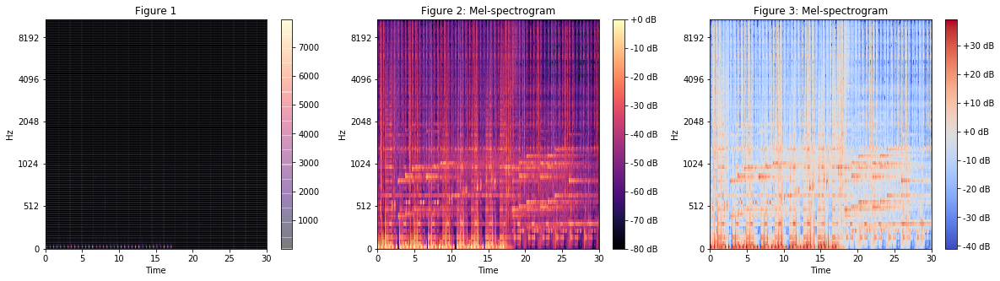

In [7]:
plt.figure(figsize = (20,5));
# 'linear', 'fft', 'hz', 'log', 'mel'


S = librosa.feature.melspectrogram(y, sr, n_mels=128)

plt.subplot(1, 3, 1) 
display.specshow(S, alpha = 0.3, x_axis='time', y_axis = 'mel')
plt.colorbar()
plt.title("Figure 1");

plt.subplot(1, 3, 2) 
log_S = librosa.power_to_db(S, ref=np.max)
librosa.display.specshow(log_S, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')
plt.title("Figure 2: Mel-spectrogram");

plt.subplot(1, 3, 3) 
logS = librosa.power_to_db(S)
display.specshow(logS, x_axis='time', y_axis = 'mel')
plt.colorbar(format='%+2.0f dB')
plt.title("Figure 3: Mel-spectrogram");


In [8]:
print("Figure 1: max unit = ", np.max(S), ", min unit = ", np.min(S))
print("Figure 2: max dB unit = ", np.max(log_S), ", min dB unit = ", np.min(log_S))
print("Figure 3: max dB unit = ", np.max(logS), ", min dB unit = ", np.min(logS))


Figure 1: max unit =  7968.020728805786 , min unit =  1.103888865216318e-08
Figure 2: max dB unit =  0.0 , min dB unit =  -80.0
Figure 3: max dB unit =  39.01350455234199 , min dB unit =  -40.98649544765801


**Output shape:** Each 2D array is made up of 128 frequency bins by 1294 time frames. A fourier transform is done on a single frame, and the values of y are sampled at each frequency bin.  

In [9]:
print(S.shape)
print(log_S.shape)
print(logS.shape)

(128, 1294)
(128, 1294)
(128, 1294)


**Many different spectrogram options**
<br>Librosa has many options for visualizing spectrograms as the data can be represented by a variety of time and frequency units. The figure below shows just a few of the different ways the same song can be visualized. 

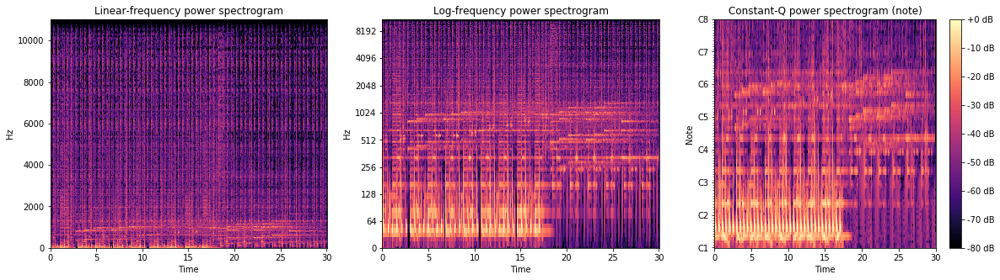

In [12]:
S = np.abs(librosa.stft(y))
D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
CQT = librosa.amplitude_to_db(np.abs(librosa.cqt(y, sr=sr)), ref=np.max)

plt.figure(figsize = (20,5));
plt.subplot(1, 3, 1)
librosa.display.specshow(D, y_axis='linear', x_axis='time') #linear frequency scale
plt.title('Linear-frequency power spectrogram')

plt.subplot(1, 3, 2)
librosa.display.specshow(D, y_axis='log', x_axis='time') #log frequency scale
plt.title('Log-frequency power spectrogram')

plt.subplot(1, 3, 3)
librosa.display.specshow(CQT, y_axis='cqt_note', x_axis='time') #Note frequency scale
plt.colorbar(format='%+2.0f dB')
plt.title('Constant-Q power spectrogram (note)');

 <a id='section2'></a>

## Section 2 - Techno vs. EDM Spectrograms
Before we convert all of our tracks into spectrograms we should visually confirm if a sample of tracks from each playlist appear different enough. In the sections below I've selected four techno tracks and four EDM tracks, printed out the waveform and spectrograms for each, and included an audio clip for each. 

### Examples of Techno tracks
To get a sense of how sound is represented in the spectrorams, feel free to listen to the track while following along with the mel-spec and notice how the fluctucations in song correspond to the frequency intensity changes.


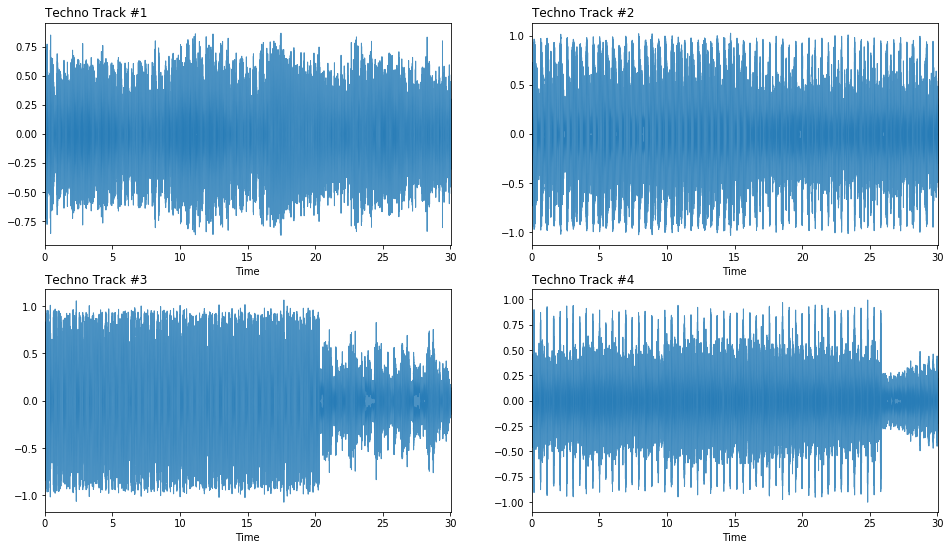

In [13]:
# waveform shown just for reference
y1, sr = librosa.load("./downloads/techno/0dAEMRmAYwxenZq74tLKCQ.mp3") #vocal chanting in ~4sec intervals, arpeggiators
y2, sr = librosa.load("./downloads/techno/0eKOBYL7Zxjgk9c9ppWvaJ.mp3") # heavy chord changes in 8sec intervals
y3, sr = librosa.load("./downloads/techno/0fhZ71vRrxvVm9TWi0t5C9.mp3") # heavy arpeggiators
y4, sr = librosa.load("./downloads/techno/0etPKXAwo4G48DpZpvRw3M.mp3") #chime beats, picks up at 10 sec

plt.figure(figsize=(16, 9))
plt.subplot(2, 2, 1) 
display.waveplot(y1, sr=sr, alpha = 0.8)
plt.title("Techno Track #1", loc='left')
plt.subplot(2, 2, 2)
display.waveplot(y2, sr=sr, alpha = 0.8)
plt.title("Techno Track #2", loc='left')
plt.subplot(2, 2, 3)
display.waveplot(y3, sr=sr, alpha = 0.8)
plt.title("Techno Track #3", loc='left')
plt.subplot(2, 2, 4)
display.waveplot(y4, sr=sr, alpha = 0.8)
plt.title("Techno Track #4", loc='left');


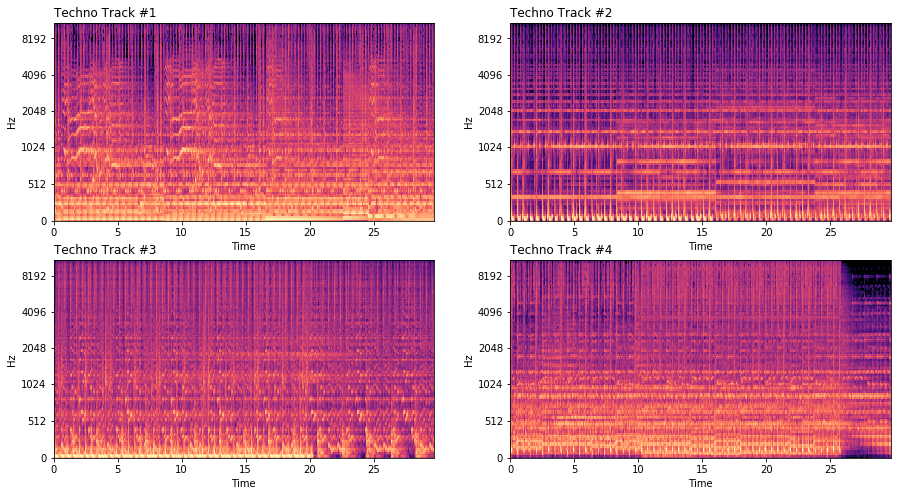

In [14]:
# listen to each track while following along with the mel-spec
ipd.display(ipd.Audio(y1, rate=sr)) #Techno Track #1
ipd.display(ipd.Audio(y2, rate=sr)) #Techno Track #2
ipd.display(ipd.Audio(y3, rate=sr)) #Techno Track #3
ipd.display(ipd.Audio(y4, rate=sr)) #Techno Track #4


plt.figure(figsize=(15, 8))
plt.subplot(2, 2, 1)
S = librosa.feature.melspectrogram(y1, sr, n_mels=128)[:,:1280]
librosa.display.specshow(librosa.power_to_db(S, ref=np.max), x_axis='time', y_axis='mel')
plt.title("Techno Track #1", loc='left')

plt.subplot(2, 2, 2)
S = librosa.feature.melspectrogram(y2, sr, n_mels=128)[:,:1280]
librosa.display.specshow(librosa.power_to_db(S, ref=np.max), x_axis='time', y_axis='mel')
plt.title("Techno Track #2", loc='left')

plt.subplot(2, 2, 3)
S = librosa.feature.melspectrogram(y3, sr, n_mels=128)[:,:1280]
librosa.display.specshow(librosa.power_to_db(S, ref=np.max), x_axis='time', y_axis='mel')
plt.title("Techno Track #3", loc='left')

plt.subplot(2, 2, 4)
S = librosa.feature.melspectrogram(y4, sr, n_mels=128)[:,:1280]
librosa.display.specshow(librosa.power_to_db(S, ref=np.max), x_axis='time', y_axis='mel')
plt.title("Techno Track #4", loc='left');

###  Examples of EDM tracks

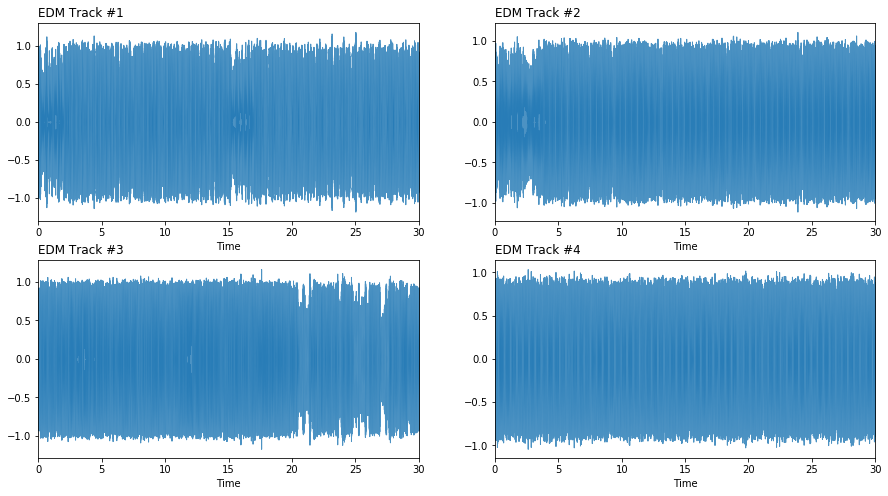

In [15]:
y1, sr = librosa.load("./downloads/edm/02JrlW4pIfzF6rouxZVFsY.mp3") #sustained descending synths at 17 sec
y2, sr = librosa.load("./downloads/edm/038k4V2bjaAQsfpYV7V9WP.mp3") #repetitive pop melody
y3, sr = librosa.load("./downloads/edm/04AYgtKFrpldRXe5y0LNGQ.mp3") #strong male vocals
y4, sr = librosa.load("./downloads/edm/04coyVwlPNfsK0icWUd1Lf.mp3") #asending melody at 6, 14, and 22 seconds

plt.figure(figsize=(15, 8));
plt.subplot(2, 2, 1) 
display.waveplot(y1, sr=sr, alpha = 0.8)
plt.title("EDM Track #1", loc='left')
plt.subplot(2, 2, 2)
display.waveplot(y2, sr=sr, alpha = 0.8)
plt.title("EDM Track #2", loc='left')
plt.subplot(2, 2, 3)
display.waveplot(y3, sr=sr, alpha = 0.8)
plt.title("EDM Track #3", loc='left')
plt.subplot(2, 2, 4)
display.waveplot(y4, sr=sr, alpha = 0.8)
plt.title("EDM Track #4", loc='left');

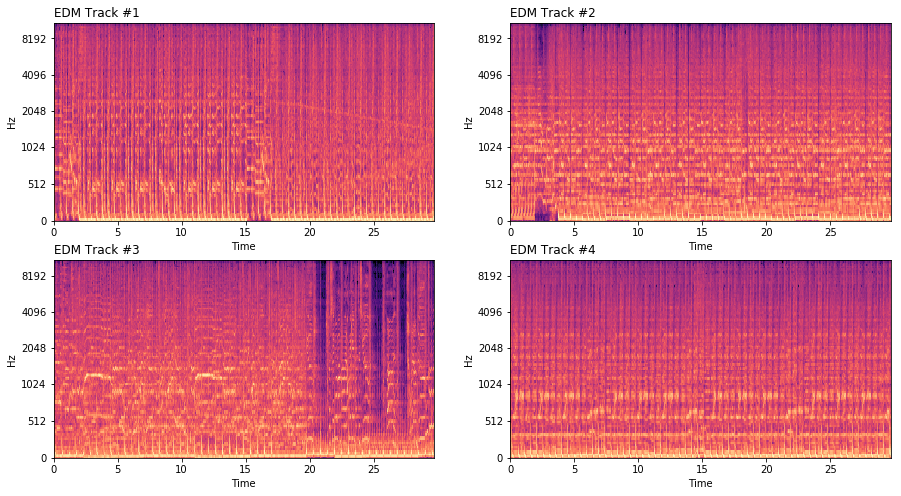

In [16]:
# listen to each track while following along with the mel-spec
ipd.display(ipd.Audio(y1, rate=sr))
ipd.display(ipd.Audio(y2, rate=sr))
ipd.display(ipd.Audio(y3, rate=sr))
ipd.display(ipd.Audio(y4, rate=sr))

plt.figure(figsize=(15, 8))
plt.subplot(2, 2, 1)
S = librosa.feature.melspectrogram(y1, sr, n_mels=128)[:,:1280]
librosa.display.specshow(librosa.power_to_db(S, ref=np.max), x_axis='time', y_axis='mel')
plt.title("EDM Track #1", loc='left')

plt.subplot(2, 2, 2)
S = librosa.feature.melspectrogram(y2, sr, n_mels=128)[:,:1280]
librosa.display.specshow(librosa.power_to_db(S, ref=np.max), x_axis='time', y_axis='mel')
plt.title("EDM Track #2", loc='left')

plt.subplot(2, 2, 3)
S = librosa.feature.melspectrogram(y3, sr, n_mels=128)[:,:1280]
librosa.display.specshow(librosa.power_to_db(S, ref=np.max), x_axis='time', y_axis='mel')
plt.title("EDM Track #3", loc='left')

plt.subplot(2, 2, 4)
S = librosa.feature.melspectrogram(y4, sr, n_mels=128)[:,:1280]
librosa.display.specshow(librosa.power_to_db(S, ref=np.max), x_axis='time', y_axis='mel')
plt.title("EDM Track #4", loc='left');

**Comparing the Techno and EDM genres** Just by comparing these four tracks alone we can gather that the techno tracks are bouncier. The kick drum and claps are more pronounced, arpeggiation is common, and the melodies are somewhat repetitive, and probably not something you would sing along to but rather hear as background room noise. Between sounds there are more "silent" deep purple regions, demonstrating the pulsing nature of these tracks, as if they are driving you forward.  


Meanwhile the EDM tracks have a greater likelihood to have vocals (with lyrics), have catchier melodies that might have you humming along, and are slightly higher energy. Most importantly, these tracks occupy more of the higher frequency regions with persisting, sweeping synths that do not have much space between chords. In general you can definitely hear that these tracks fill the sound space with the full range of frequencies.

Maybe one set of tracks speaks to you more, maybe they all do!

<a id='section3'></a>
## Section 3: Spectrogram Conversion for All Tracks
This section will demonstrate how to:
- convert all tracks to spectrograms and assign a genre label
- save spectrograms and labels
- visualize a genre as a single bitmap image

### Step 3.1 Convert all tracks to spectrograms. 
#### Save spectrograms as one list with `song_specs`, and the corresponding label tag saved in the list `genres` .
The code below will create the dictionary `genre_to_idx` that has a key for each genre in the downloads folder, and a value that is a unique label (i.e. techno:1, edm:0). All of the songs in the EDM folder will be converted to spectrograms and appended to the list `song_specs`, and the corresponding folder label will be appended to the `genres` list. Then all of the songs in the Techno folder will be converted and appended to each list. The code can take ~30 minutes to execute. 

- Two things to note for our conversion:
    1. In regards to a neural network, spectrograms are not identical to images because the axes on a spectrogram represent different things. Since a 1D convolution will perform convolutions on the y-axis, we will transpose each image to display time on the y-axis. Not surprisngly, a 1D CNN did not perform nearly as well when the images were not transposed. 
    2. Decibel units can be normalized around zero with `librosa.power_to_db(S)` or calcualted from a max reference point with `librosa.power_to_db(S, ref=np.max)`. Better results were obtained in the network when the units were normalized around zero. 
    
    

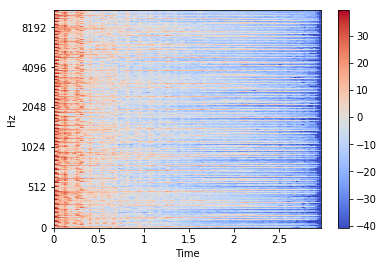

In [17]:
# create dictionary of genre folders (techno, edm) with corresponding genre label (1, 0)
song_folder = ('/Users/amytaylor/DSI/spotify_project/downloads/')

idx_to_genre = []
genre_to_idx = {}
song_specs = []
genres = []

for genre in os.listdir(song_folder):
    if genre != ".DS_Store":
        genre_to_idx[genre] = len(genre_to_idx) 
        idx_to_genre.append(genre)
        genre_folder = os.path.join(song_folder, genre) 
        for song in os.listdir(genre_folder):
            if song.endswith('.mp3'):
                mp3_file  = os.path.join(genre_folder, song)
                
                signal, sr = librosa.load(mp3_file)    
#                 S = librosa.feature.melspectrogram(signal, sr=sr, n_mels=128)[:,:1280] #not transposed
                S = librosa.feature.melspectrogram(signal, sr=sr, n_mels=128).T[:1280,] # image transposed
      
                log_S = librosa.power_to_db(S) 
#                 log_S = librosa.power_to_db(S, ref=np.max)   
    
                song_specs.append(log_S)
                genres.append(genre_to_idx[genre])     

display.specshow(log_S, sr=sr, x_axis='time', y_axis='mel') #display the last converted track only
plt.colorbar();

Oops, the figure above has the wrong axes labels. See the corrected figure below

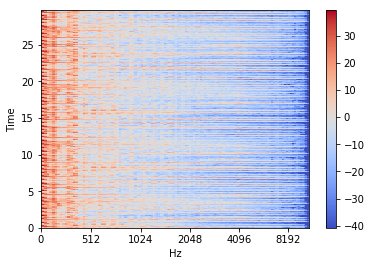

In [18]:
display.specshow(log_S, sr=sr, x_axis='mel', y_axis='time') #display the last converted track only
plt.colorbar();

In [91]:
# inspect the other variables
print(genre_to_idx)
print(idx_to_genre)

{'edm': 0, 'techno': 1}
['edm', 'techno']


### Step 3.2 Saves lists to datasets folder
Now all my spectrogram images are loaded in the list variable `song_specs` and all the labels are loaded in the list `genres`. Since the conversion took so much time, I will save each list as a numpy array. If I did not save each list as an array I would need to convert each to an array before inputing into the network. 

In [24]:
# save both lists as arrays
# NOTE: song_specs takes up > 2GB of storage space
np.save("./datasets/genres.npy", genres)
np.save("./datasets/song_specs.npy", song_specs)

In [25]:
# load both arrays
spec_list = np.load("./datasets/song_specs.npy")
genre_list = np.load("./datasets/genres.npy")

In [26]:
#inspect the arrays, verify they were both saved correctly

print(spec_list.shape)
#prints values for the: first track, first time frame, decibel values in the first 10 frequency bins
print(spec_list[0,0,0:10]) 
print("-----------------------")
print(genre_list.shape)
print(genre_list) #print the list of genre labels


(1790, 1280, 128)
[-11.5330456  -12.60505178 -11.77531484  -8.00330818  -6.70760337
  -0.99258808  -3.6645457   -5.32592455  -1.53519813  -0.10428851]
-----------------------
(1790,)
[0 0 0 ... 1 1 1]


So my entire data set consists of 1790 total songs, each one of size 1280 time frames by 128 frequency bins

In [27]:
# max and min decibel values - in case we want to normalize our data for the network
print(np.max(spec_list))
print(np.min(spec_list))

41.12451962676248
-56.075118282672165


### Step 3.3 Visualize Each Genre as a Bitmap
Let's quickly comapre the spectrograms of both genres by looking at 30 songs' melspectrograms pasted together. 

(1280, 3840)
(1280, 3840)


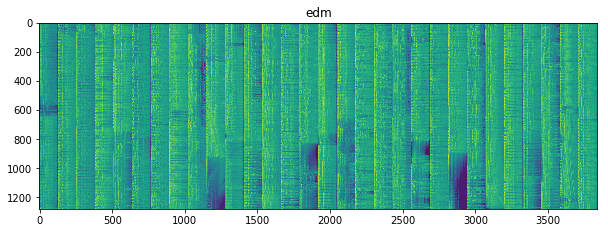

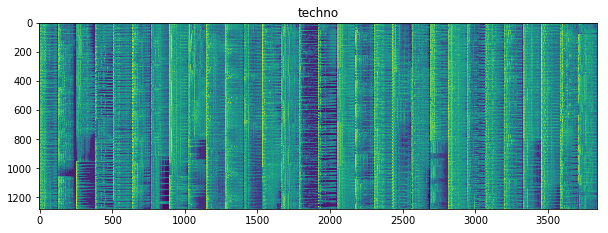

In [63]:
def show_spectogram(show_genre):
    show_genre = genre_to_idx[show_genre]
    specs = []
    for spec, genre in zip(spec_list, genre_list):
        if show_genre == genre:
            specs.append(spec)
            if len(specs) == 30:
                break
    if not specs:
        return 'not found!'
    x = np.concatenate(specs, axis=1)  
    plt.figure(figsize = (10,8))
    plt.imshow(x)
    plt.title(idx_to_genre[genre])
    return x.shape


print(show_spectogram('edm'))
print(show_spectogram('techno'))

Not surprisingly, each genre does appear to have a distinctive song image. 


<a id='section4'></a>
## Section 4:  Buidling a 1D Convolutional Neural Network
Before running the data through the network we will need to:
- One-hot encode the target data (really only necessary for multiclasses)
- Train test split
- Increase the number of samples

In [84]:
import keras
from keras.models import Sequential, Model
from keras import regularizers
from keras.layers import Input, LSTM, Dense, Dropout, Flatten, Activation
from keras.layers.merge import concatenate
from keras.layers.convolutional import Conv1D, Conv2D
from keras.layers.pooling import MaxPooling1D, GlobalMaxPooling1D, GlobalAveragePooling1D, MaxPooling2D, GlobalMaxPooling2D
from keras.layers.normalization import BatchNormalization
from keras.layers.advanced_activations import LeakyReLU

from timeit import default_timer as timer

#### Step 4.1 One-hot-encode the target data
When using Keras for multiclassification the target cannot be a single vector of multiple classes. While it's okay to have 0s and 1s for binary classification, I will go ahead and transform the target into a one-hot encoded matrix like I would if there were more than two classes. 

In [65]:
#one hot encodes my categories
genres_one_hot = keras.utils.to_categorical(genre_list, num_classes=len(genre_to_idx)) 
print(genres_one_hot.shape)
print(genres_one_hot)


(1790, 2)
[[1. 0.]
 [1. 0.]
 [1. 0.]
 ...
 [0. 1.]
 [0. 1.]
 [0. 1.]]


#### Step 4.2 Train test split and stratify the data

In [194]:
# STEP 2: train-test-split

X_train, X_test, y_train, y_test = train_test_split(   
                                                    spec_list,
                                                    #np.array(song_specs) # use if you didn't save as an array
                                                    genres_one_hot,
                                                    test_size=0.1,
                                                    random_state = 42,
                                                    stratify=genres
                                                   )

print(X_train.shape)
print(y_train.shape)

(1611, 1280, 128)
(1611, 2)


#### Step 4.3 Increase the number of songs
Since 1790 songs isn't really that much for a neural network, we can increase our dataset by a factor of 10 by spliting each song into 10 slices. Thus one input will be 128 frames (~3 sec) by 128 frequncy bins. 

In [195]:
def split_10(x, y):
    s = x.shape
    s = (s[0] * 10, s[1] // 10, s[2])
    return x.reshape(s), np.repeat(y, 10, axis=0)

X_test, y_test = split_10(X_test, y_test)
X_train, y_train = split_10(X_train, y_train)

print(X_train.shape)
print(y_train.shape)

(16110, 128, 128)
(16110, 2)


In [181]:
# X_train = X_train // 56.08
# X_test = X_test // 56.08

### Step 4.4 Create Neural Network

In [196]:
model = Sequential()
model.add(Conv1D(filters = 64, kernel_size = 4, 
                 activation = 'relu', 
                 input_shape = (128, 128),
                 kernel_regularizer=regularizers.l2(0.001))
                )
model.add(BatchNormalization())
model.add(MaxPooling1D(pool_size = 2, strides = 2))
# model.add(Dropout(0.3))

model.add(Conv1D(128, kernel_size = 4, activation = 'relu'))
model.add(BatchNormalization())
model.add(MaxPooling1D(pool_size = 2, strides = 2))
# model.add(Dropout(0.2))

model.add(Conv1D(256, kernel_size = 4, activation = 'relu'))
model.add(BatchNormalization())
model.add(MaxPooling1D(pool_size = 2, strides = 2))
# model.add(Dropout(0.3))

model.add(GlobalMaxPooling1D())
# model.add(LSTM(64, return_sequences=False))
model.add(Dropout(0.3))   


model.add(Dense(256, activation = 'relu'))
model.add(Dropout(0.3))

model.add(Dense(2, 
#                 activation = 'softmax',
                activation = 'sigmoid'
               ))

model.compile(
#               loss = 'categorical_crossentropy',
              loss = 'binary_crossentropy',
              optimizer = 'adam', 
              metrics = ['accuracy'])
              
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_112 (Conv1D)          (None, 125, 64)           32832     
_________________________________________________________________
batch_normalization_112 (Bat (None, 125, 64)           256       
_________________________________________________________________
max_pooling1d_111 (MaxPoolin (None, 62, 64)            0         
_________________________________________________________________
conv1d_113 (Conv1D)          (None, 59, 128)           32896     
_________________________________________________________________
batch_normalization_113 (Bat (None, 59, 128)           512       
_________________________________________________________________
max_pooling1d_112 (MaxPoolin (None, 29, 128)           0         
_________________________________________________________________
conv1d_114 (Conv1D)          (None, 26, 256)           131328    
__________

In [197]:
start = timer()
results = model.fit(X_train, y_train, epochs = 20, 
                    validation_data=(X_test, y_test), 
                    batch_size = 5000
                      )
end = timer()
print((end - start)/60)

Train on 16110 samples, validate on 1790 samples
Epoch 1/20
16110/16110 [==============================] - 34s 2ms/step - loss: 1.0098 - acc: 0.6822 - val_loss: 0.5608 - val_acc: 0.8899
Epoch 2/20
16110/16110 [==============================] - 20s 1ms/step - loss: 0.5266 - acc: 0.8568 - val_loss: 0.4634 - val_acc: 0.8631
Epoch 3/20
16110/16110 [==============================] - 20s 1ms/step - loss: 0.4446 - acc: 0.8570 - val_loss: 0.3940 - val_acc: 0.8883
Epoch 4/20
16110/16110 [==============================] - 19s 1ms/step - loss: 0.4024 - acc: 0.8683 - val_loss: 0.3801 - val_acc: 0.9028
Epoch 5/20
16110/16110 [==============================] - 19s 1ms/step - loss: 0.3780 - acc: 0.8812 - val_loss: 0.3540 - val_acc: 0.9031
Epoch 6/20
16110/16110 [==============================] - 19s 1ms/step - loss: 0.3595 - acc: 0.8855 - val_loss: 0.3386 - val_acc: 0.8975
Epoch 7/20
16110/16110 [==============================] - 19s 1ms/step - loss: 0.3488 - acc: 0.8882 - val_loss: 0.3397 - val_acc:

Train accuracy = 0.68 0.88 0.94
Test accuracy  = 0.89 0.9 0.92
Train loss = 1.01 0.38 0.23
Test loss = 0.56 0.35 0.27


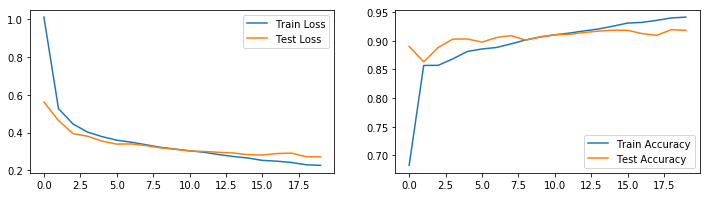

In [198]:
plt.figure(figsize = (12, 3))
plt.subplot(121)
plt.plot(results.history['loss'], label = 'Train Loss')
plt.plot(results.history['val_loss'], label = 'Test Loss')
plt.legend()
plt.subplot(122)
plt.plot(results.history['acc'], label = 'Train Accuracy')
plt.plot(results.history['val_acc'], label = 'Test Accuracy')
plt.legend()

# scores for accuracy
print("Train accuracy =", round(results.history['acc'][0], 2), round(results.history['acc'][4], 2), 
      round(results.history['acc'][-1], 2))
print("Test accuracy  =", round(results.history['val_acc'][0], 2), round(results.history['val_acc'][4], 2),
      round(results.history['val_acc'][-1], 2))

# scores for loss
print("Train loss =", round(results.history['loss'][0], 2), round(results.history['loss'][4], 2), 
      round(results.history['loss'][-1], 2))
print("Test loss =", round(results.history['val_loss'][0], 2), round(results.history['val_loss'][4], 2), 
      round(results.history['val_loss'][-1], 2))

**Summary of things that improved network**
- Batch size (around 3000-5000)
- L2 Regularization 
- Dropout layers - most effective after global max pooling 

**Little or no change in performance:**
- Using a final activation and loss of sigmoid/binary crossentropy instead of softmax/categorical crossentropy
- Kernel size 
- Scaling the input values
- Increasing number of epochs >20

**Sped up time:**
- Increased max pool stride (stride = 2 is MUCH faster than stride = 1, with similar accuracy)
- Number of filters in each layer (start with less, increase deeper in network)

<a id='section5'></a>
## Section 5: 2D CNN
This section demonstrates how to set up a 2-dimensional convolutional neural network. The parameters tested are slightly different than above because running the 2D network took about an hour. Due to the time intensive nature of the 2D network, only one test was run and the results were not further optimized, as it seemed that the 1D network could provide similar results with a fraction of the computational power. 

In [254]:
# train-test-split

X_train, X_test, y_train, y_test = train_test_split(np.array(song_specs), 
                                                    np.array(genres_one_hot),
                                                    test_size=0.2,
                                                    random_state = 42,
                                                    stratify=genres
                                                   )

print(X_train.shape)
print(y_train.shape)

(1432, 1280, 128)
(1432, 2)


In [255]:
def split_10(x, y):
    s = x.shape
    s = (s[0] * 10, s[1] // 10, s[2], 1)
    return x.reshape(s), np.repeat(y, 10, axis=0)

X_test, y_test = split_10(X_test, y_test)
X_train, y_train = split_10(X_train, y_train)

print(X_train.shape)
print(y_train.shape)

(14320, 128, 128, 1)
(14320, 2)


In [256]:
# print out a model summary before fitting?
model = Sequential()
model.add(Conv2D(filters = 16, kernel_size = 4, 
                 activation = 'relu', 
                 input_shape = (128, 128, 1)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size = 2, strides = 2))

# should dropout only go after dense layer?
model.add(Dropout(0.3))

model.add(Conv2D(32, kernel_size = 4, activation = 'relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size = 2, strides = 2))
model.add(Dropout(0.2))

# model.add(Conv2D(32, kernel_size = 4, activation = 'relu'))
# model.add(BatchNormalization())
# model.add(MaxPooling2D(pool_size = 2, strides = 2))
# # model.add(Dropout(0.3))

model.add(GlobalMaxPooling2D())


model.add(Dense(32, activation = 'relu'))
model.add(Dropout(0.5))

model.add(Dense(2, 
                activation = 'softmax',
#                 activation = 'sigmoid')
               ))

model.compile(
              loss = 'categorical_crossentropy',
#               loss = 'binary_crossentropy',
              optimizer = 'adam', 
              metrics = ['accuracy'])
              
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_17 (Conv2D)           (None, 125, 125, 16)      272       
_________________________________________________________________
batch_normalization_92 (Batc (None, 125, 125, 16)      64        
_________________________________________________________________
max_pooling2d_12 (MaxPooling (None, 62, 62, 16)        0         
_________________________________________________________________
dropout_65 (Dropout)         (None, 62, 62, 16)        0         
_________________________________________________________________
conv2d_18 (Conv2D)           (None, 59, 59, 32)        8224      
_________________________________________________________________
batch_normalization_93 (Batc (None, 59, 59, 32)        128       
_________________________________________________________________
max_pooling2d_13 (MaxPooling (None, 29, 29, 32)        0         
__________

In [257]:
results = model.fit(X_train, y_train, epochs = 10, validation_data=(X_test, y_test))

Train on 14320 samples, validate on 3580 samples
Epoch 1/10
14320/14320 [==============================] - 300s 21ms/step - loss: 0.6767 - acc: 0.7779 - val_loss: 0.3313 - val_acc: 0.8908
Epoch 2/10
14320/14320 [==============================] - 278s 19ms/step - loss: 0.3692 - acc: 0.8417 - val_loss: 0.2516 - val_acc: 0.9112
Epoch 3/10
14320/14320 [==============================] - 283s 20ms/step - loss: 0.3415 - acc: 0.8553 - val_loss: 0.2429 - val_acc: 0.9123
Epoch 4/10
14320/14320 [==============================] - 287s 20ms/step - loss: 0.3202 - acc: 0.8679 - val_loss: 0.2177 - val_acc: 0.9173
Epoch 5/10
14320/14320 [==============================] - 264s 18ms/step - loss: 0.3147 - acc: 0.8728 - val_loss: 0.2300 - val_acc: 0.9243
Epoch 6/10
14320/14320 [==============================] - 268s 19ms/step - loss: 0.3003 - acc: 0.8770 - val_loss: 0.2389 - val_acc: 0.9260
Epoch 7/10
14320/14320 [==============================] - 269s 19ms/step - loss: 0.2923 - acc: 0.8797 - val_loss: 0.2

In [258]:
# this is the final score for train loss, test loss
print(results.history['acc'][-1])
print(results.history['val_acc'][-1])

# final score for train accuracy, test accuracy
print(results.history['loss'][-1])
print(results.history['val_loss'][-1])

0.889036312849162
0.9125698324022347
0.27247540133292447
0.2246592711636474


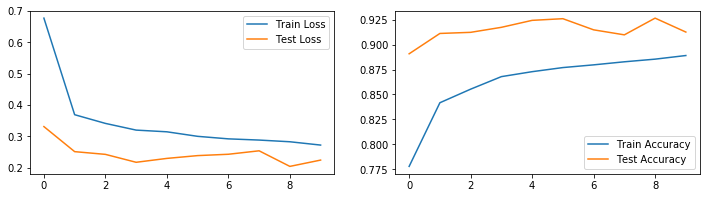

In [259]:
plt.figure(figsize = (12, 3))
plt.subplot(121)
plt.plot(results.history['loss'], label = 'Train Loss')
plt.plot(results.history['val_loss'], label = 'Test Loss')
plt.legend()
plt.subplot(122)
plt.plot(results.history['acc'], label = 'Train Accuracy')
plt.plot(results.history['val_acc'], label = 'Test Accuracy')
plt.legend()